PROYECTO TALENTO TECH -ANALISIS DE DATOS NIVEL INNOVADOR - GRUPO 1

FECHA: 24-05-2024

POR: Lizeth Dayana Garces Garces

TUTOR: Ing. Andres Felipe Escallon Portilla

Version 1.0

Proyecto de analsis de datos 

Relación de IPS públicas y privadas según el nivel de atención y capacidad instalada

Fuente: Base de datos Registros Especial de Prestadores de Servicios de Salud - REPS

Diligencia la Encuesta de Satisfacción:
https://tramites.minsalud.gov.co/FormularioInscripcion/EncuestaSatisfaccion.aspx

Última Actualización20 de abril de 2024

Datos suministrados porMINISTERIO DE SALUD Y PROTECCIÓN SOCIAL

Datos abiertos

PASO 1: Descargar la base de datos de la pagina de datos abiertos.
Link: https://www.datos.gov.co/Salud-y-Protecci-n-Social/Relaci-n-de-IPS-p-blicas-y-privadas-seg-n-el-nivel/s2ru-bqt6/about_data

PASO 2: Configuración de la base de datos Oracle 21c de manera local

![alt text](image.png)


PASO 3: Cargue de los datos a la base de datos anteriormente configurada.

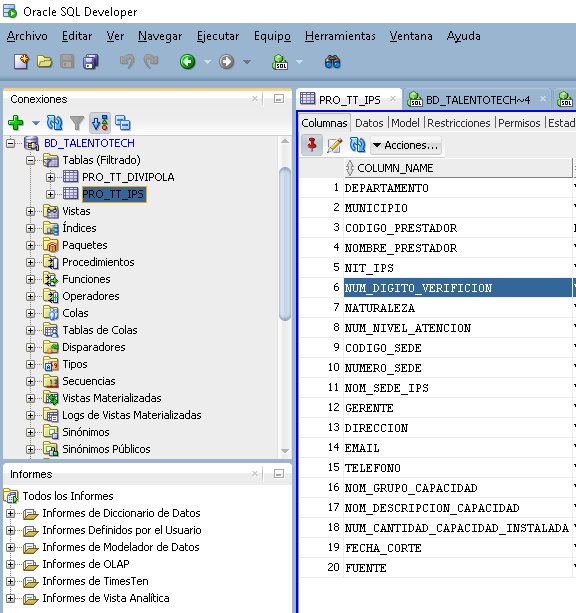

PASO 4: Analisis de las variables segun la definicion de DATOS ABIERTOS:

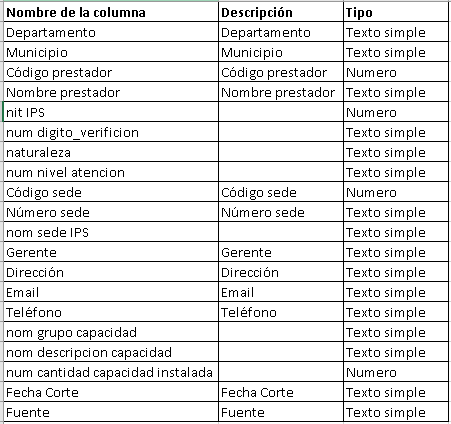

PASO 5: Analisis y limpieza de datos mediante el uso de SQL.

Ver: Archivo SQL (ANALISIS.SQL)

PASO 6: Graficar datos mediante el uso de linrerias como:

- cx_Oracle
- oracledb
- pandas


In [16]:
pip install cx_Oracle --upgrade

Note: you may need to restart the kernel to use updated packages.


In [17]:
pip install oracledb --upgrade

   ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
    --------------------------------------- 0.0/1.6 MB 991.0 kB/s eta 0:00:02
    --------------------------------------- 0.0/1.6 MB 991.0 kB/s eta 0:00:02
    --------------------------------------- 0.0/1.6 MB 991.0 kB/s eta 0:00:02
    --------------------------------------- 0.0/1.6 MB 991.0 kB/s eta 0:00:02
    --------------------------------------- 0.0/1.6 MB 991.0 kB/s eta 0:00:02
    --------------------------------------- 0.0/1.6 MB 991.0 kB/s eta 0:00:02
   - -------------------------------------- 0.1/1.6 MB 206.9 kB/s eta 0:00:08
   -- ------------------------------------- 0.1/1.6 MB 249.8 kB/s eta 0:00:07
   -- ------------------------------------- 0.1/1.6 MB 235.7 kB/s eta 0:00:07
   -- ------------------------------------- 0.1/1.6 MB 235.7 kB/s eta 0:00:07
   -- ------------------------------------- 0.1/1.6 MB 232.7 kB/s eta 0:00:07
   -

In [23]:
pip install pandas --upgrade

   ---------------------------------------- 0.0/11.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/11.6 MB 1.3 MB/s eta 0:00:10
   ---------------------------------------- 0.0/11.6 MB 1.3 MB/s eta 0:00:10
   ---------------------------------------- 0.1/11.6 MB 491.5 kB/s eta 0:00:24
   ---------------------------------------- 0.1/11.6 MB 726.2 kB/s eta 0:00:16
    --------------------------------------- 0.2/11.6 MB 748.1 kB/s eta 0:00:16
    --------------------------------------- 0.2/11.6 MB 901.1 kB/s eta 0:00:13
    --------------------------------------- 0.2/11.6 MB 901.1 kB/s eta 0:00:13
   - -------------------------------------- 0.4/11.6 MB 1.0 MB/s eta 0:00:11
   - -------------------------------------- 0.5/11.6 MB 1.3 MB/s eta 0:00:09
   - -------------------------------------- 0.6/11.6 MB 1.2 MB/s eta 0:00:10
   -- ------------------------------------- 0.9/11.6 MB 1.7 MB/s eta 0:00:07
   --- ------------------------------------ 1.1/11.6 MB 2.0 MB/s eta 0:00

  You can safely remove it manually.
  You can safely remove it manually.


- Ejemplo de conexion a la base de datos oracle

In [5]:
import cx_Oracle

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Crear un cursor
cursor = connection.cursor()

# Ejecutar una consulta
cursor.execute("SELECT * FROM PRO_TT_IPS")

# Imprimir los resultados
for row in cursor:
    print(row)

# Cerrar el cursor y la conexión
cursor.close()
connection.close()


('Amazonas', 'EL ENCANTO', 9100100019, 'E.S.E. HOSPITAL SAN RAFAEL DE LETICIA', '838000096', '7', 'Pública', '2', '9126300019', '11', 'CENTRO DE SALUD SAN RAFAEL - E.S.E HOSPITAL SAN RAFAEL DE LETICIA', 'SAIDA VIVIANA HERREÑO PRIETO', 'CORREGIMIENTO DEL ENCANTO', 'sanrafael@esehospitalsanrafael-leticia-amazonas.gov.co', '3203016139', 'CAMAS', 'Pediátrica', '3', 'Fecha corte REPS: Nov  5 2022  1:37PM', 'Base de datos Registro Especial de Prestadores de Servicios de Salud - REPS.')
('Amazonas', 'EL ENCANTO', 9100100019, 'E.S.E. HOSPITAL SAN RAFAEL DE LETICIA', '838000096', '7', 'Pública', '2', '9126300019', '11', 'CENTRO DE SALUD SAN RAFAEL - E.S.E HOSPITAL SAN RAFAEL DE LETICIA', 'SAIDA VIVIANA HERREÑO PRIETO', 'CORREGIMIENTO DEL ENCANTO', 'sanrafael@esehospitalsanrafael-leticia-amazonas.gov.co', '3203016139', 'CAMAS', 'Adultos', '4', 'Fecha corte REPS: Nov  5 2022  1:37PM', 'Base de datos Registro Especial de Prestadores de Servicios de Salud - REPS.')
('Amazonas', 'EL ENCANTO', 910010

- Ejemplo de conexion a base de datos oracle y crearcion del dataframe para la creacion de graficas

In [27]:
import pandas as pd
import cx_Oracle

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)


query = "SELECT * FROM PRO_TT_IPS"
table_PRO_TT_IPS = pd.read_sql(query, con=connection)

# Mostrar el DataFrame
print(table_PRO_TT_IPS)

# Cerrar la conexión
connection.close()

C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\676879033.py:12: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  table_PRO_TT_IPS = pd.read_sql(query, con=connection)


      DEPARTAMENTO      MUNICIPIO  CODIGO_PRESTADOR  \
0         Amazonas     EL ENCANTO        9100100019   
1         Amazonas     EL ENCANTO        9100100019   
2         Amazonas     EL ENCANTO        9100100019   
3         Amazonas     EL ENCANTO        9100100019   
4         Amazonas     EL ENCANTO        9100100019   
...            ...            ...               ...   
41422      Vichada  SANTA ROSALÍA        9900100006   
41423      Vichada  SANTA ROSALÍA        9900100006   
41424      Vichada  SANTA ROSALÍA        9900100006   
41425      Vichada  SANTA ROSALÍA        9900100006   
41426      Vichada  SANTA ROSALÍA        9900100006   

                                     NOMBRE_PRESTADOR    NIT_IPS  \
0               E.S.E. HOSPITAL SAN RAFAEL DE LETICIA  838000096   
1               E.S.E. HOSPITAL SAN RAFAEL DE LETICIA  838000096   
2               E.S.E. HOSPITAL SAN RAFAEL DE LETICIA  838000096   
3               E.S.E. HOSPITAL SAN RAFAEL DE LETICIA  838000096   

In [36]:
table_PRO_TT_IPS

,DEPARTAMENTO,MUNICIPIO,CODIGO_PRESTADOR,NOMBRE_PRESTADOR,NIT_IPS,NUM_DIGITO_VERIFICION,NATURALEZA,NUM_NIVEL_ATENCION,CODIGO_SEDE,NUMERO_SEDE,NOM_SEDE_IPS,GERENTE,DIRECCION,EMAIL,TELEFONO,NOM_GRUPO_CAPACIDAD,NOM_DESCRIPCION_CAPACIDAD,NUM_CANTIDAD_CAPACIDAD_INSTALADA,FECHA_CORTE,FUENTE
0,Amazonas,EL ENCANTO,9100100019,E.S.E. HOSPITAL SAN RAFAEL DE LETICIA,838000096,7,Pública,2,9126300019,11,CENTRO DE SALUD SAN RAFAEL - E.S.E HOSPITAL SA...,SAIDA VIVIANA HERREÑO PRIETO,CORREGIMIENTO DEL ENCANTO,sanrafael@esehospitalsanrafael-leticia-amazona...,3203016139,CAMAS,Pediátrica,3,Fecha corte REPS: Nov 5 2022 1:37PM,Base de datos Registro Especial de Prestadores...
1,Amazonas,EL ENCANTO,9100100019,E.S.E. HOSPITAL SAN RAFAEL DE LETICIA,838000096,7,Pública,2,9126300019,11,CENTRO DE SALUD SAN RAFAEL - E.S.E HOSPITAL SA...,SAIDA VIVIANA HERREÑO PRIETO,CORREGIMIENTO DEL ENCANTO,sanrafael@esehospitalsanrafael-leticia-amazona...,3203016139,CAMAS,Adultos,4,Fecha corte REPS: Nov 5 2022 1:37PM,Base de datos Registro Especial de Prestadores...
2,Amazonas,EL ENCANTO,9100100019,E.S.E. HOSPITAL SAN RAFAEL DE LETICIA,838000096,7,Pública,2,9126300019,11,CENTRO DE SALUD SAN RAFAEL - E.S.E HOSPITAL SA...,SAIDA VIVIANA HERREÑO PRIETO,CORREGIMIENTO DEL ENCANTO,sanrafael@esehospitalsanrafael-leticia-amazona...,3203016139,CAMAS,TPR,1,Fecha corte REPS: Nov 5 2022 1:37PM,Base de datos Registro Especial de Prestadores...
3,Amazonas,EL ENCANTO,9100100019,E.S.E. HOSPITAL SAN RAFAEL DE LETICIA,838000096,7,Pública,2,9126300019,11,CENTRO DE SALUD SAN RAFAEL - E.S.E HOSPITAL SA...,SAIDA VIVIANA HERREÑO PRIETO,CORREGIMIENTO DEL ENCANTO,sanrafael@esehospitalsanrafael-leticia-amazona...,3203016139,CAMAS,Atención del Parto,1,Fecha corte REPS: Nov 5 2022 1:37PM,Base de datos Registro Especial de Prestadores...
4,Amazonas,EL ENCANTO,9100100019,E.S.E. HOSPITAL SAN RAFAEL DE LETICIA,838000096,7,Pública,2,9126300019,11,CENTRO DE SALUD SAN RAFAEL - E.S.E HOSPITAL SA...,SAIDA VIVIANA HERREÑO PRIETO,CORREGIMIENTO DEL ENCANTO,sanrafael@esehospitalsanrafael-leticia-amazona...,3203016139,CAMILLAS,Observación Pediátrica,2,Fecha corte REPS: Nov 5 2022 1:37PM,Base de datos Registro Especial de Prestadores...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41422,Vichada,SANTA ROSALÍA,9900100006,E.S.E. HOSPITAL DEPARTAMENTAL SAN JUAN DE DIOS,842000004,4,Pública,2,9962400006,09,HOSPITAL SEDE SANTA ROSALIA,ALVARO ALBERTO CARDOSO CASTRO,EL CENTRO,calidad@esesanjuandediospc.gov.co,3102349354,CAMILLAS,Observación Adultos Mujeres,1,Fecha corte REPS: Nov 5 2022 1:37PM,Base de datos Registro Especial de Prestadores...
41423,Vichada,SANTA ROSALÍA,9900100006,E.S.E. HOSPITAL DEPARTAMENTAL SAN JUAN DE DIOS,842000004,4,Pública,2,9962400006,09,HOSPITAL SEDE SANTA ROSALIA,ALVARO ALBERTO CARDOSO CASTRO,EL CENTRO,calidad@esesanjuandediospc.gov.co,3102349354,CONSULTORIOS,Urgencias,1,Fecha corte REPS: Nov 5 2022 1:37PM,Base de datos Registro Especial de Prestadores...
41424,Vichada,SANTA ROSALÍA,9900100006,E.S.E. HOSPITAL DEPARTAMENTAL SAN JUAN DE DIOS,842000004,4,Pública,2,9962400006,09,HOSPITAL SEDE SANTA ROSALIA,ALVARO ALBERTO CARDOSO CASTRO,EL CENTRO,calidad@esesanjuandediospc.gov.co,3102349354,CONSULTORIOS,Consulta Externa,4,Fecha corte REPS: Nov 5 2022 1:37PM,Base de datos Registro Especial de Prestadores...
41425,Vichada,SANTA ROSALÍA,9900100006,E.S.E. HOSPITAL DEPARTAMENTAL SAN JUAN DE DIOS,842000004,4,Pública,2,9962400006,09,HOSPITAL SEDE SANTA ROSALIA,ALVARO ALBERTO CARDOSO CASTRO,EL CENTRO,calidad@esesanjuandediospc.gov.co,3102349354,SALAS,Partos,1,Fecha corte REPS: Nov 5 2022 1:37PM,Base de datos Registro Especial de Prestadores...


In [7]:
import pandas as pd
import folium
import cx_Oracle

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL y cargar los datos en un DataFrame
query = """
SELECT  D.NOM_DPTO||'-'||D.NOM_MPIO as DEPMUN, latitud, longitud
FROM PRO_TT_IPS I
INNER JOIN PRO_TT_DIVIPOLA D ON (UPPER(I.DEPARTAMENTO)||I.MUNICIPIO = D.NOM_DPTO||D.NOM_MPIO)
GROUP BY  D.NOM_DPTO||'-'||D.NOM_MPIO, latitud, longitud
"""
df = pd.read_sql_query(query, connection)

# Cerrar la conexión a la base de datos
connection.close()

df


C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\4168334226.py:18: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, connection)


,DEPMUN,LATITUD,LONGITUD
0,AMAZONAS-MIRITÍ - PARANÁ,-0.687038,-71.185505
1,AMAZONAS-PUERTO SANTANDER,-1.101033,-71.938934
2,AMAZONAS-TARAPACÁ,-2.451794,-70.006515
3,ANTIOQUIA-AMALFI,6.977789,-74.981239
4,ANTIOQUIA-ANDES,5.604993,-75.941284
...,...,...,...
1093,TOLIMA-RONCESVALLES,4.097861,-75.594280
1094,VALLE DEL CAUCA-GUADALAJARA DE BUGA,3.819854,-75.983124
1095,VALLE DEL CAUCA-LA UNIÓN,4.537937,-76.103290
1096,VALLE DEL CAUCA-TRUJILLO,4.233268,-76.342927


In [6]:
pip install --upgrade folium

   ---------------------------------------- 0.0/100.0 kB ? eta -:--:--
   ----------- --------------------------- 30.7/100.0 kB 660.6 kB/s eta 0:00:01
   ----------- --------------------------- 30.7/100.0 kB 660.6 kB/s eta 0:00:01
   --------------------------- ----------- 71.7/100.0 kB 491.5 kB/s eta 0:00:01
   -------------------------------------- 100.0/100.0 kB 575.5 kB/s eta 0:00:00
   ---------------------------------------- 0.0/82.0 kB ? eta -:--:--
   ---------------------------------------  81.9/82.0 kB 4.5 MB/s eta 0:00:01
   ---------------------------------------- 82.0/82.0 kB 1.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [8]:
import folium
# Crear un mapa centrado en una ubicación inicial (Colombia)
mapa = folium.Map(location=[4.570868, -74.297333], zoom_start=5)
mapa

In [11]:
df

,DEPMUN,LATITUD,LONGITUD
0,AMAZONAS-MIRITÍ - PARANÁ,-0.687038,-71.185505
1,AMAZONAS-PUERTO SANTANDER,-1.101033,-71.938934
2,AMAZONAS-TARAPACÁ,-2.451794,-70.006515
3,ANTIOQUIA-AMALFI,6.977789,-74.981239
4,ANTIOQUIA-ANDES,5.604993,-75.941284
...,...,...,...
1093,TOLIMA-RONCESVALLES,4.097861,-75.594280
1094,VALLE DEL CAUCA-GUADALAJARA DE BUGA,3.819854,-75.983124
1095,VALLE DEL CAUCA-LA UNIÓN,4.537937,-76.103290
1096,VALLE DEL CAUCA-TRUJILLO,4.233268,-76.342927


In [9]:
#crear mapa
mapa = folium.Map(location=[df['LATITUD'].mean(), df['LONGITUD'].mean()], zoom_start=4)

# Agregar puntos al mapa
for idx, row in df.iterrows():
    folium.Marker([row['LATITUD'], row['LONGITUD']]).add_to(mapa)

mapa


Pregunta 1:
Cantidad de prestadores por departamento

In [2]:
pip install matplotlib --upgrade

   ---------------------------------------- 0.0/8.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/8.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/8.0 MB 1.3 MB/s eta 0:00:07
   ---------------------------------------- 0.0/8.0 MB 495.5 kB/s eta 0:00:16
   ---------------------------------------- 0.1/8.0 MB 544.7 kB/s eta 0:00:15
    --------------------------------------- 0.1/8.0 MB 656.4 kB/s eta 0:00:12
    --------------------------------------- 0.2/8.0 MB 748.1 kB/s eta 0:00:11
   - -------------------------------------- 0.2/8.0 MB 778.2 kB/s eta 0:00:10
   - -------------------------------------- 0.3/8.0 MB 886.2 kB/s eta 0:00:09
   - -------------------------------------- 0.3/8.0 MB 855.7 kB/s eta 0:00:09
   - -------------------------------------- 0.4/8.0 MB 882.8 kB/s eta 0:00:09
   -- ------------------------------------- 0.4/8.0 MB 949.4 kB/s eta 0:00:08
   -- ------------------------------------- 0.5/8.0 MB 1.0 MB/s eta 0:00:08
   --- -

  You can safely remove it manually.
  You can safely remove it manually.


In [30]:
import matplotlib.pyplot as plt
import pandas as pd

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL
query = """
SELECT REGISTROS,DEPARTAMENTO  FROM (
SELECT COUNT(*) AS REGISTROS, UPPER(DEPARTAMENTO) AS DEPARTAMENTO
FROM PRO_TT_IPS
GROUP BY DEPARTAMENTO
ORDER BY 2 ASC)
"""
df_pregunta1 = pd.read_sql(query, connection)

# Cerrar la conexión
connection.close()



C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\780051651.py:18: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_pregunta1 = pd.read_sql(query, connection)


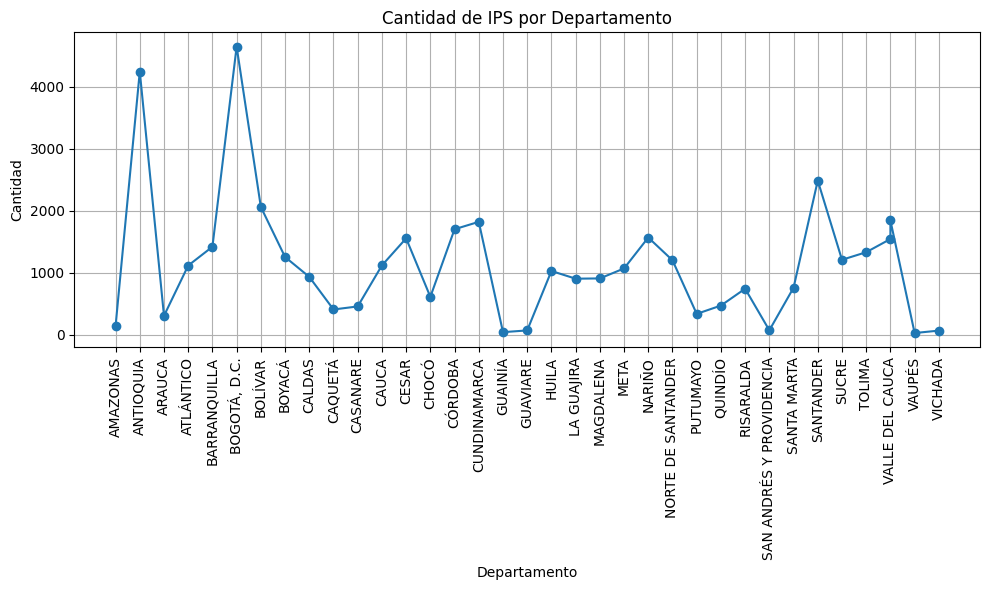

In [24]:
# Crear la gráfica de líneas
plt.figure(figsize=(10, 6))
plt.plot(df_pregunta1['DEPARTAMENTO'], df_pregunta1['REGISTROS'], marker='o', linestyle='-')
plt.xlabel('Departamento')
plt.ylabel('Cantidad')
plt.title('Cantidad de IPS por Departamento')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()  # Para ajustar el layout y que los labels no se corten
plt.show()

Interpretacion grafica:
Muestra el conteo de ips por departamento mostrando que la ciudad de Bogota y el departamento de antioquia es quien mas tienen IPS para prestacion de servicios de salud.

PREGUNTA 2:
Cuantas Ips hay clasificadas por naturaleza

C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\2051087665.py:20: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_pregunta2 = pd.read_sql(query, connection)


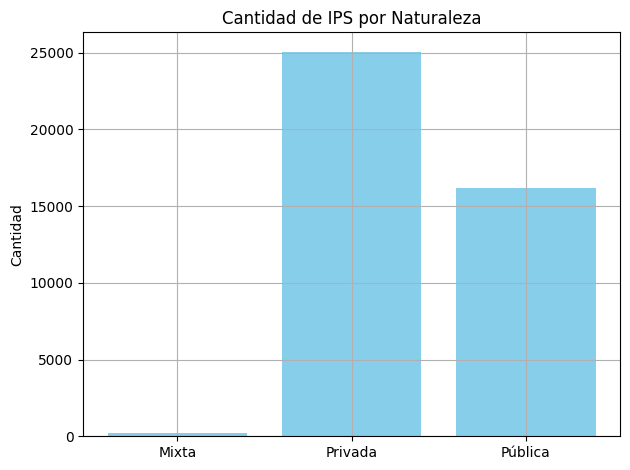

In [39]:
import matplotlib.pyplot as plt
import pandas as pd

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL
query = """
SELECT REGISTROS,NATURALEZA  
FROM (
    SELECT COUNT(*) AS REGISTROS, NATURALEZA
    FROM PRO_TT_IPS
    GROUP BY NATURALEZA
    ORDER BY 2 ASC
)
"""
df_pregunta2 = pd.read_sql(query, connection)

# Cerrar la conexión
connection.close()

# Crear la gráfica de barras
plt.bar(df_pregunta2['NATURALEZA'], df_pregunta2['REGISTROS'], color='skyblue')
#plt.xlabel('Naturaleza')
plt.ylabel('Cantidad')
plt.title('Cantidad de IPS por Naturaleza')
plt.xticks(rotation=0)
plt.grid(True)
plt.tight_layout()  # Para ajustar el layout y que los labels no se corten
plt.show()



Interpretacion grafica:
Muestra el conteo de ips por naturaleza mostrando que hay mas IPS privadas para la prestacion de servicios de salud

Pregunta 3:
cantidad de prestadores clasificada por naturaleza pare el departamnento del cauca

C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\1400842241.py:21: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_pregunta2 = pd.read_sql(query, connection)


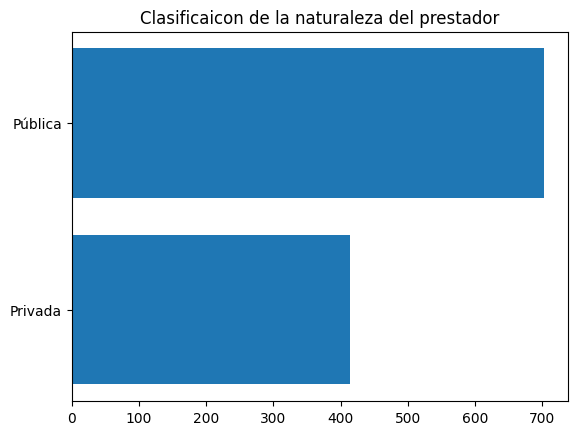

In [83]:
import matplotlib.pyplot as plt
import pandas as pd

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL
query = """
SELECT REGISTROS,NATURALEZA  
FROM (
    SELECT COUNT(*) AS REGISTROS, NATURALEZA
    FROM PRO_TT_IPS
    WHERE DEPARTAMENTO='Cauca'
    GROUP BY NATURALEZA
    ORDER BY 2 ASC
)
"""
df_pregunta2 = pd.read_sql(query, connection)

# Cerrar la conexión
connection.close()


plt.figure()
plt.barh(df_pregunta2.NATURALEZA, df_pregunta2.REGISTROS)
plt.title('Clasificaicon de la naturaleza del prestador')
plt.show()

Interpretacion grafica:
Muestra el conteo de ips por naturaleza mostrando que hay mas IPS publicas para la prestacion de servicios de salud en el departamento del Cauca.

PREGUNTA 4:
Cuantos tipos de servicio hay habilitados para el deparmaento del cauca

C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\2457140482.py:20: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_pregunta4 = pd.read_sql(query, connection)


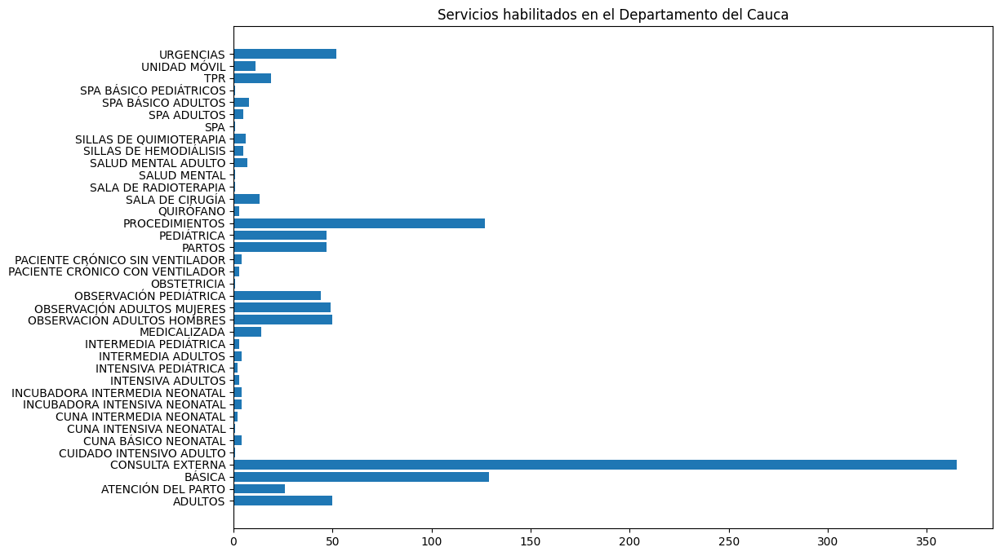

In [82]:
import matplotlib.pyplot as plt
import pandas as pd

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL
query = """
SELECT REGISTROS, ESPECIALIDAD
FROM(
    SELECT COUNT(*) AS REGISTROS, UPPER(NOM_DESCRIPCION_CAPACIDAD) AS ESPECIALIDAD
    FROM PRO_TT_IPS
    WHERE DEPARTAMENTO='Cauca'
    GROUP BY NOM_DESCRIPCION_CAPACIDAD
    ORDER BY 2 ASC)
"""
df_pregunta4 = pd.read_sql(query, connection)

# Cerrar la conexión
connection.close()


plt.figure(figsize=(12, 8))
plt.barh(df_pregunta4.ESPECIALIDAD, df_pregunta4.REGISTROS)
plt.title('Servicios habilitados en el Departamento del Cauca')
plt.show()

Interpretacion grafica:
Muestra el conteo de ips por especialidad mostrando que hay mas IPS para la atencion de la especialidad de CONSULTA EXTERNA en el departamento del Cauca.

Pregunta 5:
Cuantos servicios tienen habilitados el municipio de popayan y cuantos prestadores hayt por cada servicio habilitado.

C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\1115290905.py:20: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_pregunta5 = pd.read_sql(query, connection)


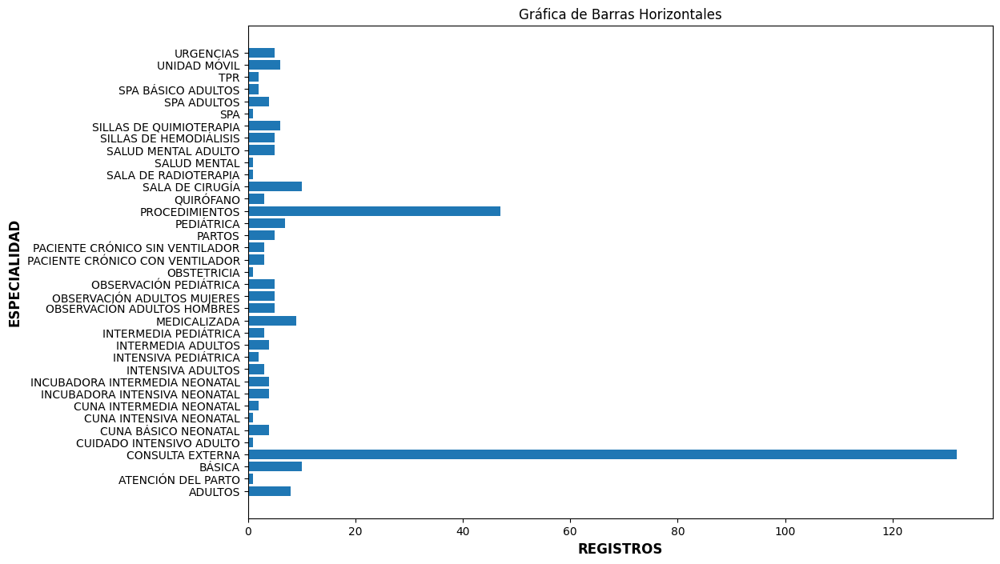

In [56]:
import matplotlib.pyplot as plt
import pandas as pd

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL
query = """
SELECT REGISTROS, ESPECIALIDAD
FROM(
    SELECT COUNT(DISTINCT NOMBRE_PRESTADOR ) AS REGISTROS, UPPER(NOM_DESCRIPCION_CAPACIDAD) AS ESPECIALIDAD
    FROM PRO_TT_IPS
    WHERE DEPARTAMENTO='Cauca' and MUNICIPIO ='POPAYÁN'
    GROUP BY NOM_DESCRIPCION_CAPACIDAD
    ORDER BY 2 ASC)
"""
df_pregunta5 = pd.read_sql(query, connection)

# Cerrar la conexión
connection.close()


plt.figure(figsize=(12, 8))
plt.barh(df_pregunta5.ESPECIALIDAD, df_pregunta5.REGISTROS)
plt.title('Servicios habilitados municipio de Popayán')
plt.xlabel('REGISTROS', fontsize=12, fontweight='bold')
plt.ylabel('ESPECIALIDAD', fontsize=12, fontweight='bold')
plt.show()

Interpretacion grafica:
Muestra el conteo de ips por especialidad mostrando que hay mas IPS para la atencion de la especialidad de CONSULTA EXTERNA en el departamento del Cauca al municipio de Popayán.

In [57]:
df_pregunta5

,REGISTROS,ESPECIALIDAD
0,8,ADULTOS
1,1,ATENCIÓN DEL PARTO
2,10,BÁSICA
3,132,CONSULTA EXTERNA
4,1,CUIDADO INTENSIVO ADULTO
5,4,CUNA BÁSICO NEONATAL
6,1,CUNA INTENSIVA NEONATAL
7,2,CUNA INTERMEDIA NEONATAL
8,4,INCUBADORA INTENSIVA NEONATAL
9,4,INCUBADORA INTERMEDIA NEONATAL


Pregunta 6:
Cuantas veces aparece en la base de datos los nombres del grupo de capacidad y cuales son los nombres de los grupos de capacidad

C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\2620563595.py:15: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_pregunta6 = pd.read_sql(query, connection)


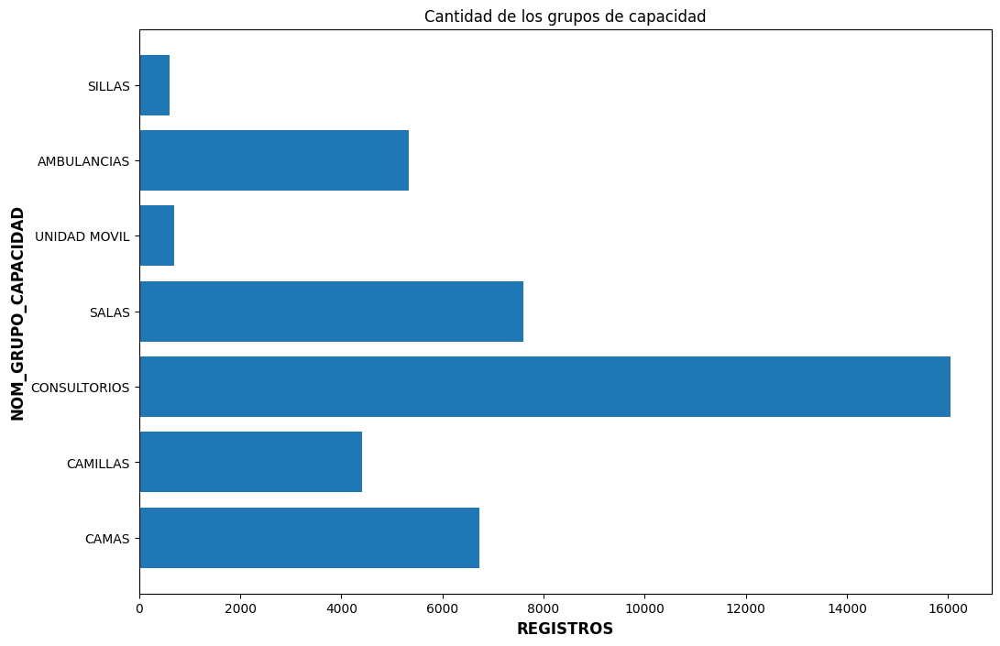

In [81]:
import matplotlib.pyplot as plt
import pandas as pd

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL
query = """
SELECT COUNT(*) AS REGISTROS, NOM_GRUPO_CAPACIDAD 
FROM PRO_TT_IPS GROUP BY NOM_GRUPO_CAPACIDAD
"""
df_pregunta6 = pd.read_sql(query, connection)

# Cerrar la conexión
connection.close()


plt.figure(figsize=(12, 8))
plt.barh(df_pregunta6.NOM_GRUPO_CAPACIDAD, df_pregunta6.REGISTROS)
plt.title('Cantidad de los grupos de capacidad')
plt.xlabel('REGISTROS', fontsize=12, fontweight='bold')
plt.ylabel('NOM_GRUPO_CAPACIDAD', fontsize=12, fontweight='bold')
plt.show()

Interpretacion grafica:
Muestra el conteo de ips por grupo de capacidad mostrando que hay mayor prevalencia de consultorios la atencion de la de usuarios a nivel nacional.

EXTRACCION Y CARGA DE DATOS - ETL

In [64]:
#Instalar la libreria que permite leer los archivos en excel
pip install openpyxl

   ---------------------------------------- 0.0/250.0 kB ? eta -:--:--
   ---- ---------------------------------- 30.7/250.0 kB 660.6 kB/s eta 0:00:01
   ---- ---------------------------------- 30.7/250.0 kB 660.6 kB/s eta 0:00:01
   ------ -------------------------------- 41.0/250.0 kB 245.8 kB/s eta 0:00:01
   --------- ----------------------------- 61.4/250.0 kB 328.2 kB/s eta 0:00:01
   --------- ----------------------------- 61.4/250.0 kB 328.2 kB/s eta 0:00:01
   --------- ----------------------------- 61.4/250.0 kB 328.2 kB/s eta 0:00:01
   --------- ----------------------------- 61.4/250.0 kB 328.2 kB/s eta 0:00:01
   --------- ----------------------------- 61.4/250.0 kB 328.2 kB/s eta 0:00:01
   ----------------------------- -------- 194.6/250.0 kB 472.6 kB/s eta 0:00:01
   ----------------------------- -------- 194.6/250.0 kB 472.6 kB/s eta 0:00:01
   ------------------------------- ------ 204.8/250.0 kB 389.1 kB/s eta 0:00:01
   ---------------------------------- --- 225.3/2

Leer el archivo en excel que permite obtener los datos de ubicacion de los departtamentos de colombia que me permitira graficar datos en el mapa solo por departamento

In [68]:
import pandas as pd

# Reemplaza 'data.xlsx' con el nombre de tu archivo
file_name = 'DIVIPOLA_Departamentos.xlsx'


# Especifica el nombre de la hoja que deseas leer
sheet_name = 'Hoja1'

# Leer el archivo de Excel
df_divipola_departamentos = pd.read_excel(file_name,sheet_name )

# Mostrar las primeras filas del DataFrame para asegurarte de que se ha leído correctamente
print(df_divipola_departamentos.head())


   Código        Nombre    LATITUD   LONGITUD
0       5     ANTIOQUIA   6.702032 -75.504557
1       8     ATLÁNTICO  10.677010 -74.965219
2      11  BOGOTÁ, D.C.   4.316108 -74.181073
3      13       BOLÍVAR   8.079797 -74.235148
4      15        BOYACÁ   5.891673 -72.627881


Cargue de los datos a la base de datos oracle

In [72]:
# Conectar a la base de datos de Oracle y cargar los datos
import cx_Oracle

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Crear un cursor
cursor = connection.cursor()


# Insertar los datos del DataFrame en la tabla de Oracle
for index, row in df_divipola_departamentos.iterrows():
    cursor.execute("""
        INSERT INTO PRO_TT_DIVIPOLA_DEPTOS (Código, Nombre, LATITUD, LONGITUD)
        VALUES (:1, :2, :3, :4)
        """,
        (row['Código'], row['Nombre'], row['LATITUD'],row['LONGITUD']))

# Confirmar los cambios
connection.commit()

# Cerrar el cursor y la conexión
cursor.close()
connection.close()

Validar el cargue de la informacion a la base de datos.

In [73]:
import pandas as pd

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL
query = """
SELECT * FROM PRO_TT_DIVIPOLA_DEPTOS
"""
df_PRO_TT_DIVIPOLA_DEPTOS = pd.read_sql(query, connection)

# Cerrar la conexión
connection.close()

df_divipola_departamentos

C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\1255753235.py:13: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_PRO_TT_DIVIPOLA_DEPTOS = pd.read_sql(query, connection)


,Código,Nombre,LATITUD,LONGITUD
0,5,ANTIOQUIA,6.702032,-75.504557
1,8,ATLÁNTICO,10.677010,-74.965219
2,11,"BOGOTÁ, D.C.",4.316108,-74.181073
3,13,BOLÍVAR,8.079797,-74.235148
4,15,BOYACÁ,5.891673,-72.627881
5,17,CALDAS,5.280140,-75.274983
6,18,CAQUETÁ,0.798556,-73.959468
7,19,CAUCA,2.396834,-76.824233
8,20,CESAR,9.536660,-73.517832
9,23,CÓRDOBA,8.358550,-75.792009


Pregunta 7
Cuantas Camas hay para el servicio de cuidados intermedios por departamentos


C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\1705169133.py:19: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_pregunta7 = pd.read_sql(query, connection)


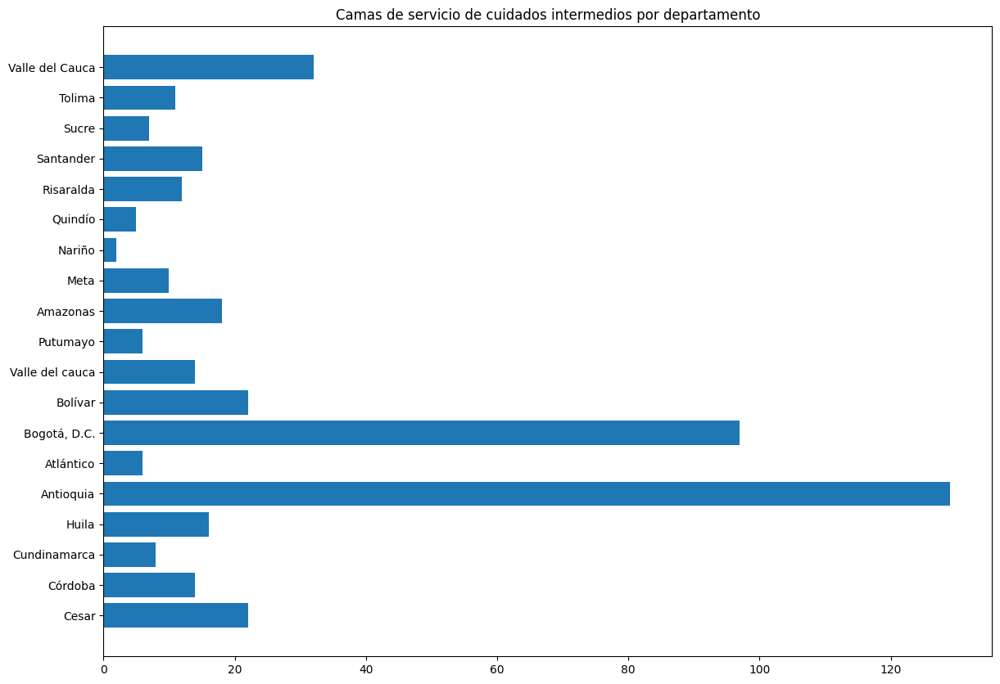

In [80]:
import matplotlib.pyplot as plt
import pandas as pd

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL
query = """
SELECT SUM(TO_NUMBER(NUM_CANTIDAD_CAPACIDAD_INSTALADA))AS CANTIDAD_CAMAS, DEPARTAMENTO 
FROM PRO_TT_IPS I
INNER JOIN PRO_TT_DIVIPOLA D ON (UPPER(I.DEPARTAMENTO)||I.MUNICIPIO = D.NOM_DPTO||D.NOM_MPIO)
WHERE NOM_DESCRIPCION_CAPACIDAD='Cuidado Intermedio Adulto'
AND NOM_GRUPO_CAPACIDAD='CAMAS'
GROUP BY DEPARTAMENTO
"""
df_pregunta7 = pd.read_sql(query, connection)

# Cerrar la conexión
connection.close()


plt.figure(figsize=(14, 10))
plt.barh(df_pregunta7.DEPARTAMENTO, df_pregunta7.CANTIDAD_CAMAS)
plt.title('Camas de servicio de cuidados intermedios por departamento')
plt.show()


Interpretacion grafica:
Muestra el conteo de camas por la especialidad de cuidados intermedios por departamento obteniendo como mayor cantidad el departamento de Antioquia.

Pregunta 8
cuantos prestadores hay por departamento

In [84]:
import folium
import pandas as pd

# Configurar la cadena de conexión
dsn_tns = cx_Oracle.makedsn('127.0.0.1', 1521, service_name='XE')

# Conectar a la base de datos
connection = cx_Oracle.connect(user='system', password='Admin123', dsn=dsn_tns)

# Ejecutar la consulta SQL
query = """
SELECT COUNT(CODIGO_PRESTADOR), DEPARTAMENTO, LATITUD, LONGITUD
FROM PRO_TT_IPS I
INNER JOIN PRO_TT_DIVIPOLA D ON (UPPER(I.DEPARTAMENTO)||I.MUNICIPIO = D.NOM_DPTO||D.NOM_MPIO)
WHERE NOM_DESCRIPCION_CAPACIDAD='Cuidado Intermedio Adulto'
AND NOM_GRUPO_CAPACIDAD='CAMAS'
GROUP BY DEPARTAMENTO, LATITUD, LONGITUD
"""
df_pregunta8 = pd.read_sql(query, connection)

# Cerrar la conexión
connection.close()

df_pregunta8



C:\Users\Dayana Garces\AppData\Local\Temp\ipykernel_7716\225574492.py:19: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_pregunta8 = pd.read_sql(query, connection)


,COUNT(CODIGO_PRESTADOR),DEPARTAMENTO,LATITUD,LONGITUD
0,2,Cesar,10.218903,-73.457848
1,1,Cesar,9.946391,-73.866288
2,2,Córdoba,8.584698,-75.950551
3,1,Cundinamarca,4.930403,-74.029851
4,1,Cundinamarca,4.857824,-74.038095
5,1,Cundinamarca,4.581866,-74.240297
6,2,Huila,2.993360,-75.272362
7,9,Antioquia,6.257590,-75.611031
8,1,Antioquia,6.154395,-75.546868
9,1,Antioquia,6.150786,-75.410761


In [85]:
# Crear un mapa centrado en una ubicación inicial (Colombia)
mapa = folium.Map(location=[4.570868, -74.297333], zoom_start=5)

#crear mapa
mapa = folium.Map(location=[df_pregunta8['LATITUD'].mean(), df['LONGITUD'].mean()], zoom_start=4)

# Agregar puntos al mapa
for idx, row in df.iterrows():
    folium.Marker([row['LATITUD'], row['LONGITUD']]).add_to(mapa)

mapa

Bibliografia

ChatGPT:

Promt usados:

- Instalar BD ORACLE
Hola tu eres experto en oracle, puedes indicarme como debo instalar y crear una base de datos en mi pc de manera local


- Configuracion del colab.
Hola, tu eres un experto en cuadernos de google colab, puedes indicarme como conecto mi base de datos oracle que esta instalada de manera local en mi equipo a un cuaderno de colab creado en visual studio


- hola tu eres ecperto en colab como leo una tabla de oracle con pandas con la siguiente consulta
tables = pd.read_sql("""SELECT * FROM PRO_TT_IPS""", connection)
tables
 

- Graficar mapa
Hola, tu eres experto en python y en google colab pueden indicarme como puedo graficar la siguiente consulta sql SELECT DEPARTAMENTO, MUNICIPIO, latitud,longitud
FROM PRO_TT_IPS I
INNER JOIN PRO_TT_DIVIPOLA D ON (UPPER(I.DEPARTAMENTO)||I.MUNICIPIO = D.NOM_DPTO||D.NOM_MPIO)
en un mapa 
